# Principais ferramentas GIS

Buffer, Clip, Merge, Dissolve, Intersect e Difference Union

In [3]:
#!pip install --upgrade fiona

In [1]:
import pandas as pd
import geopandas as gpd
import fiona
import contextily as cx
import os

In [2]:
data_est_trem = r"C:\Users\sergio\Documents\GeoDev\MOD8\dados\Estacao_Trem_SP.shp"
data_lin_trem = r"C:\Users\sergio\Documents\GeoDev\MOD8\dados\Linha_Trem_SP.shp"

In [3]:
data_est_trem = gpd.read_file(data_est_trem)
data_lin_trem = gpd.read_file(data_lin_trem)

In [4]:
data_est_trem.head()

,etr_situac,etr_linha,etr_nome,etr_empres,geometry
0,OPERANDO,DIAMANTE,PARADA AMADOR BUENO,CPTM,POINT (297477.101 7396351.054)
1,OPERANDO,RUBI,JUNDIAÍ,CPTM,POINT (308378.796 7433640.756)
2,OPERANDO,ESMERALDA,PRIMAVERA-INTERLAGOS,CPTM,POINT (327545.649 7375448.035)
3,OPERANDO,ESMERALDA,GRAJAÚ,CPTM,POINT (327027.861 7373920.436)
4,OPERANDO,TURQUESA,PREFEITO CELSO DANIEL-SANTO ANDRÉ,CPTM,POINT (344127.852 7383458.049)


In [5]:
data_est_trem.crs

<Projected CRS: EPSG:31983>
Name: SIRGAS 2000 / UTM zone 23S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Brazil - 48°W to 42°W
- bounds: (-48.0, -33.5, -42.0, 5.13)
Coordinate Operation:
- name: UTM zone 23S
- method: Transverse Mercator
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

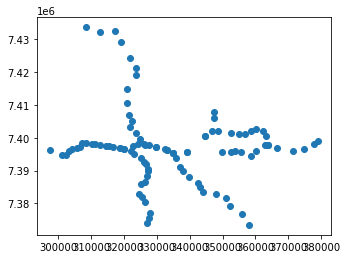

In [6]:
data_est_trem.plot()

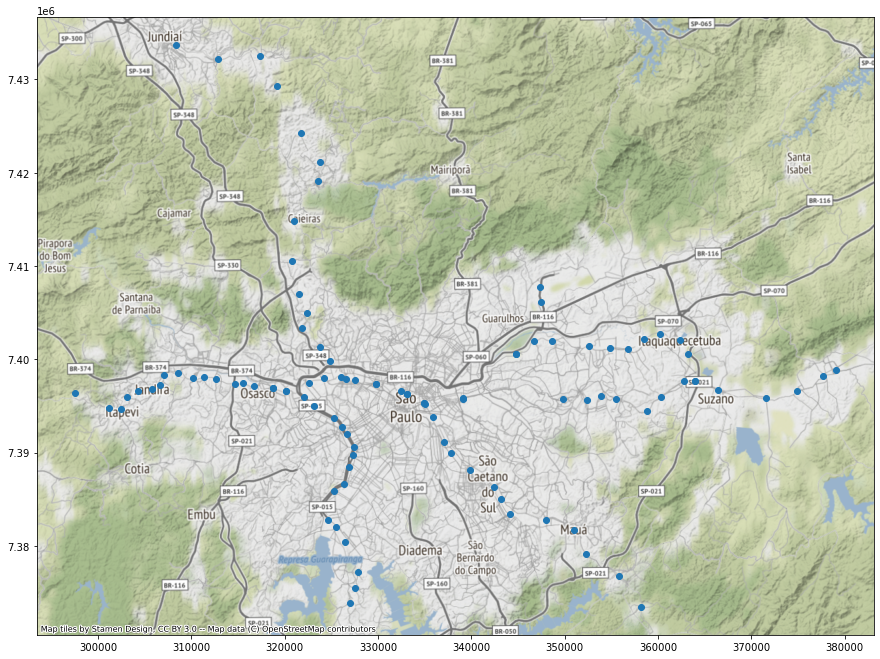

In [7]:
ax = data_est_trem.plot(figsize=(15,15), color='None')
data_est_trem.plot(ax=ax)
cx.add_basemap(ax, crs=data_est_trem.crs)

# Buffer

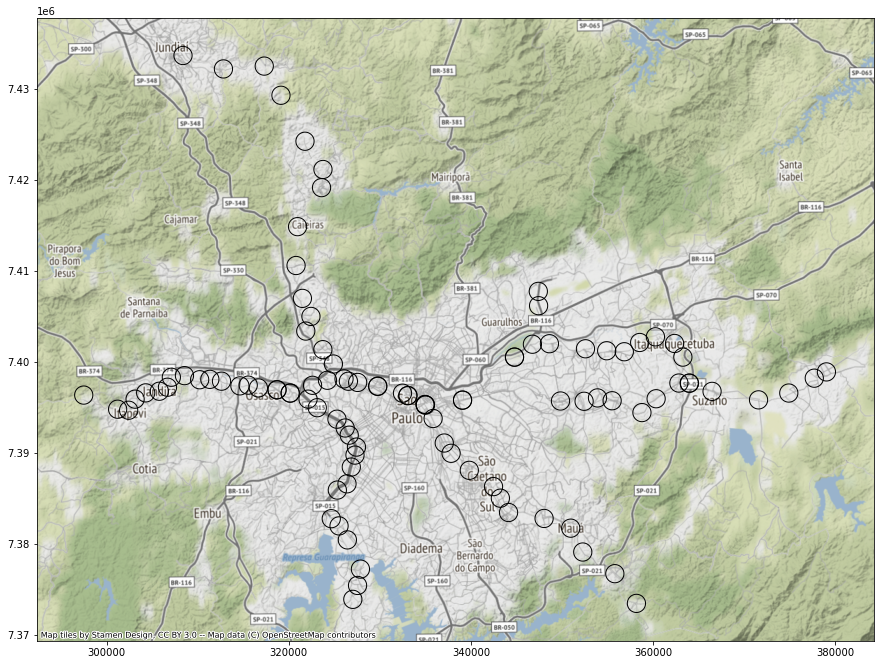

In [9]:
ax = data_est_trem.plot(figsize=(15,15), color='None')
data_est_trem.buffer(1000).plot(ax=ax, edgecolor='black', color='None')
cx.add_basemap(ax, crs=data_est_trem.crs)

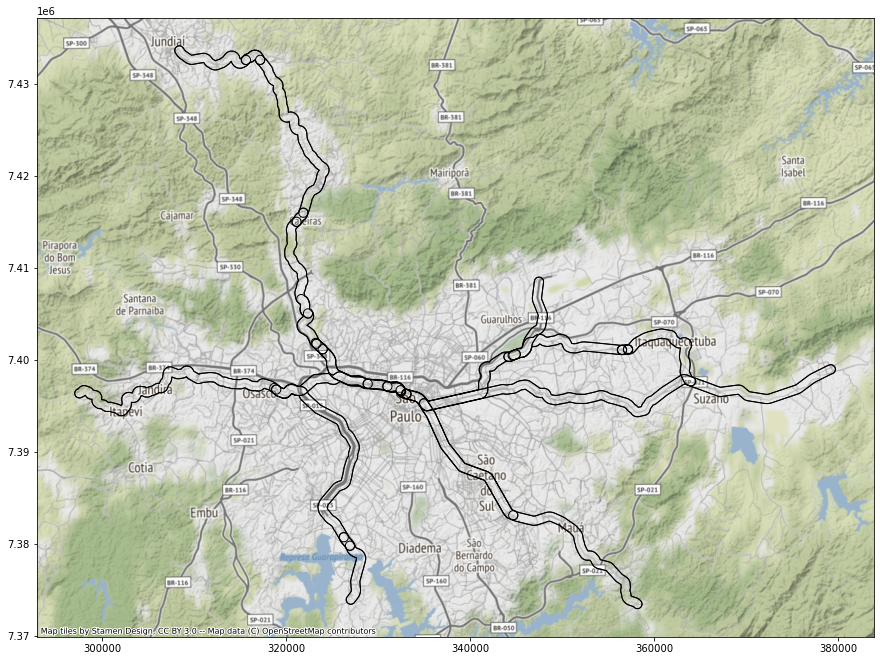

In [10]:
ax = data_lin_trem.plot(figsize=(15,15), color='None')
data_lin_trem.buffer(500).plot(ax=ax, edgecolor='black', color='None')
cx.add_basemap(ax, crs=data_lin_trem.crs)

# Intersecção e Diferença

In [28]:
est_trem_buff = data_est_trem.buffer(1000)
lin_trem_buff = data_lin_trem.buffer(500)

In [29]:
lin_trem_buff.head()

0    POLYGON ((344209.966 7400832.378, 344223.927 7...
1    POLYGON ((344527.493 7400981.663, 344533.839 7...
2    POLYGON ((344387.389 7400907.608, 344391.247 7...
3    POLYGON ((319277.581 7397115.058, 319307.731 7...
4    POLYGON ((319229.336 7397155.049, 319238.743 7...
dtype: geometry

In [30]:
type(lin_trem_buff)

geopandas.geoseries.GeoSeries

In [31]:
A = gpd.GeoDataFrame({'geometry': est_trem_buff})
B = gpd.GeoDataFrame({'geometry': lin_trem_buff})

In [32]:
# Realizar a Intersecção
A_interct_B = A.overlay(B, how='intersection')

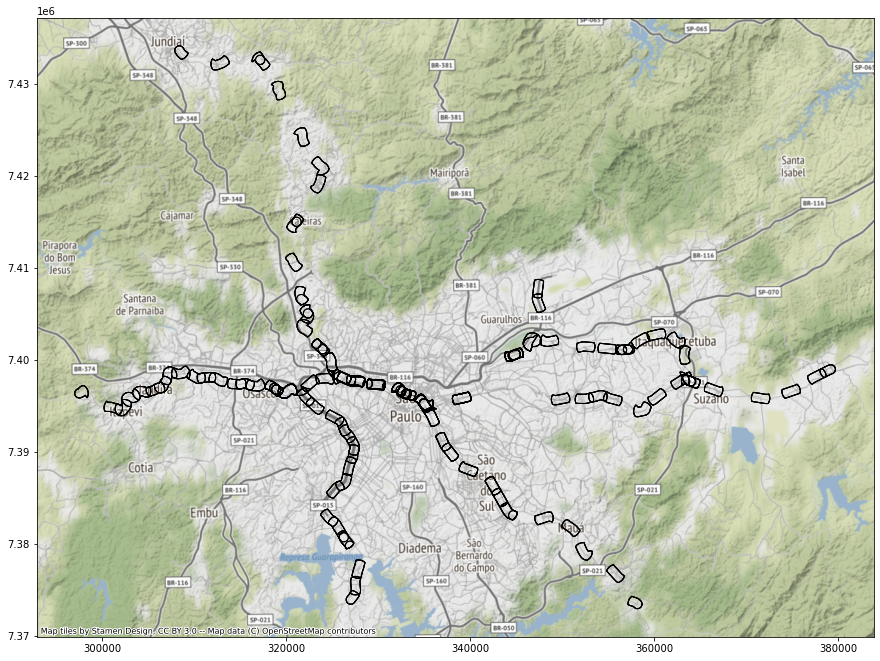

In [33]:
ax = A_interct_B.plot(figsize=(15, 15), color="None")

A_interct_B.plot(ax=ax, edgecolor='black', color='None')

cx.add_basemap(ax, crs=A_interct_B.crs)

In [34]:
A_diffe_B = A.overlay(B, how='difference')

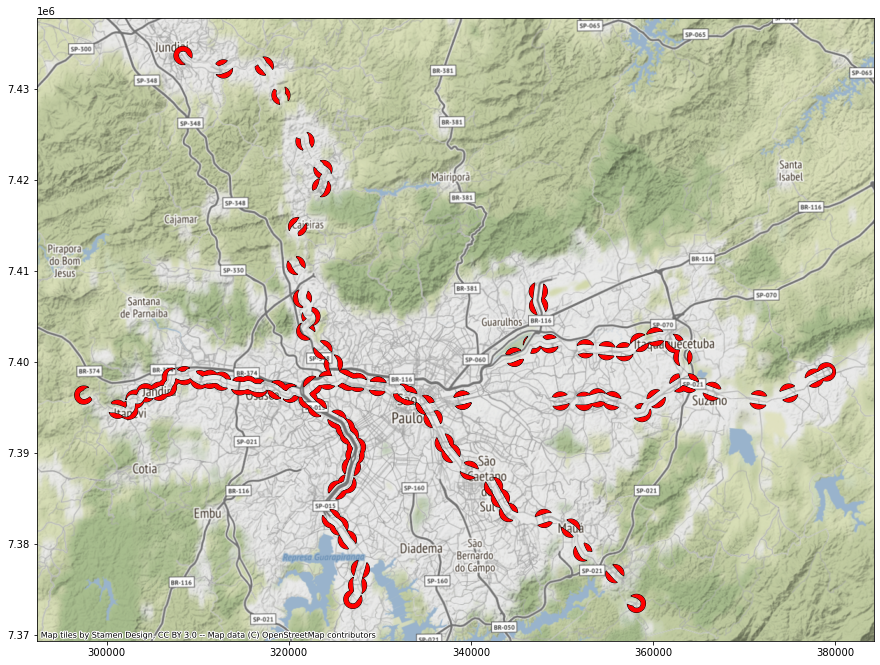

In [35]:
ax = A_diffe_B.plot(figsize=(15, 15), color="None")

A_diffe_B.plot(ax=ax, edgecolor='none', color='red')

cx.add_basemap(ax, crs=A_diffe_B.crs)

# Dissolve

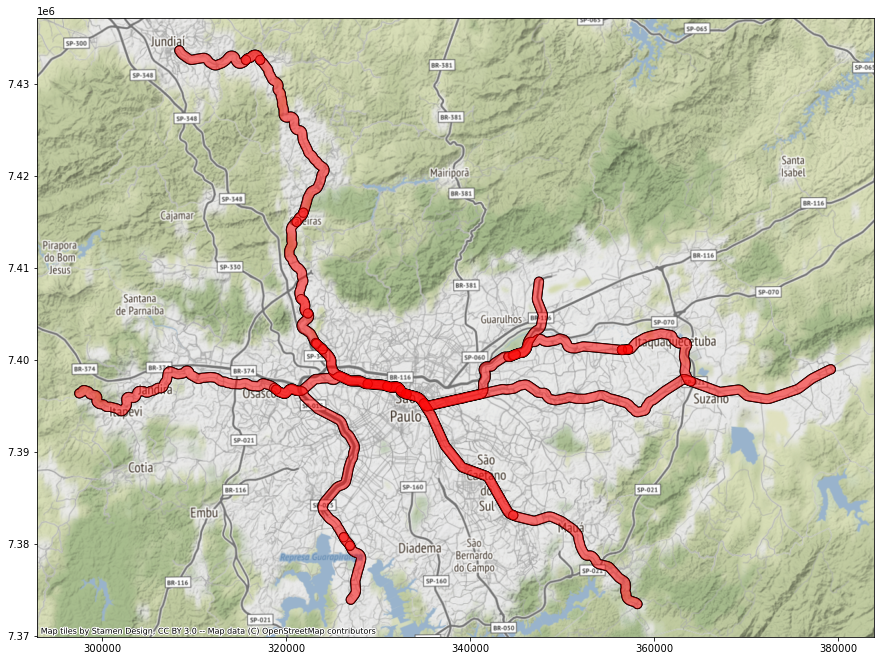

In [36]:
ax = B.plot(figsize=(15, 15), color="None")

B.plot(ax=ax, edgecolor='none', color='red', alpha=0.3)

cx.add_basemap(ax, crs=B.crs)

In [37]:
lin_trem_dissolve = B.dissolve()

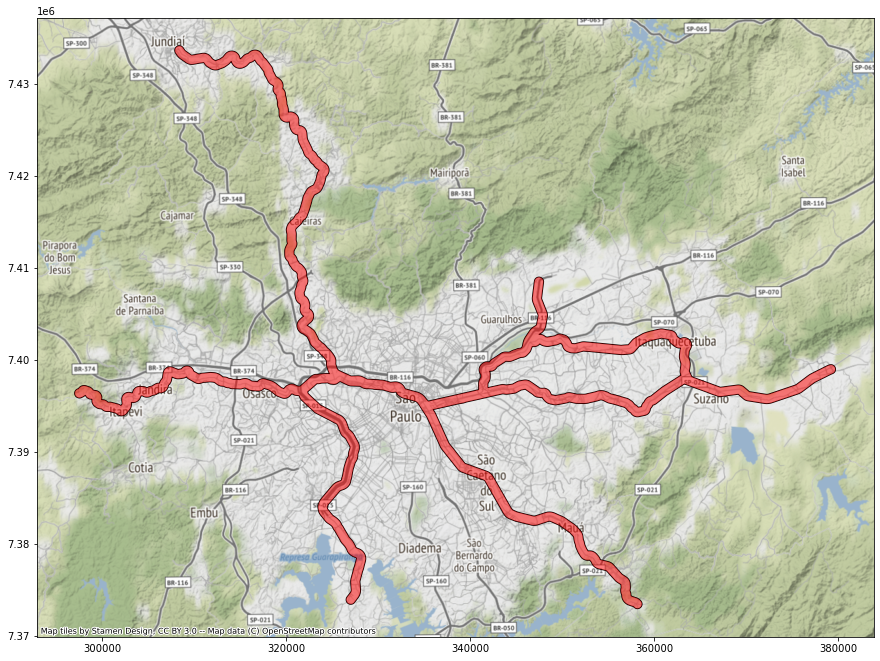

In [38]:
ax = lin_trem_dissolve.plot(figsize=(15, 15), color="None")

lin_trem_dissolve.plot(ax=ax, edgecolor='none', color='red', alpha=0.5)

cx.add_basemap(ax, crs=B.crs)

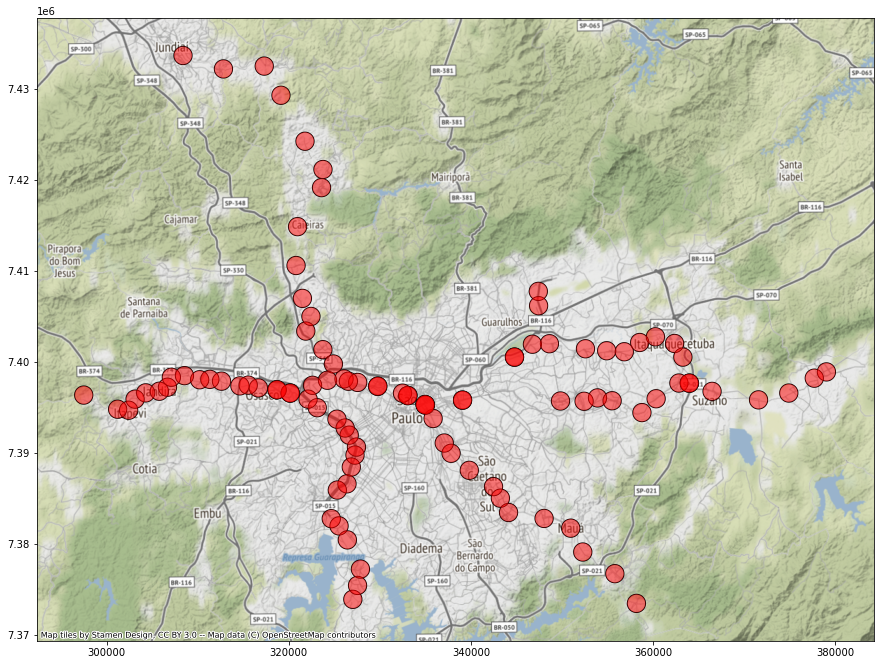

In [39]:
ax = A.plot(figsize=(15, 15), color="None")

A.plot(ax=ax, edgecolor='none', color='red', alpha=0.5)

cx.add_basemap(ax, crs=A.crs)

In [40]:
est_trem_dissolve = A.dissolve()

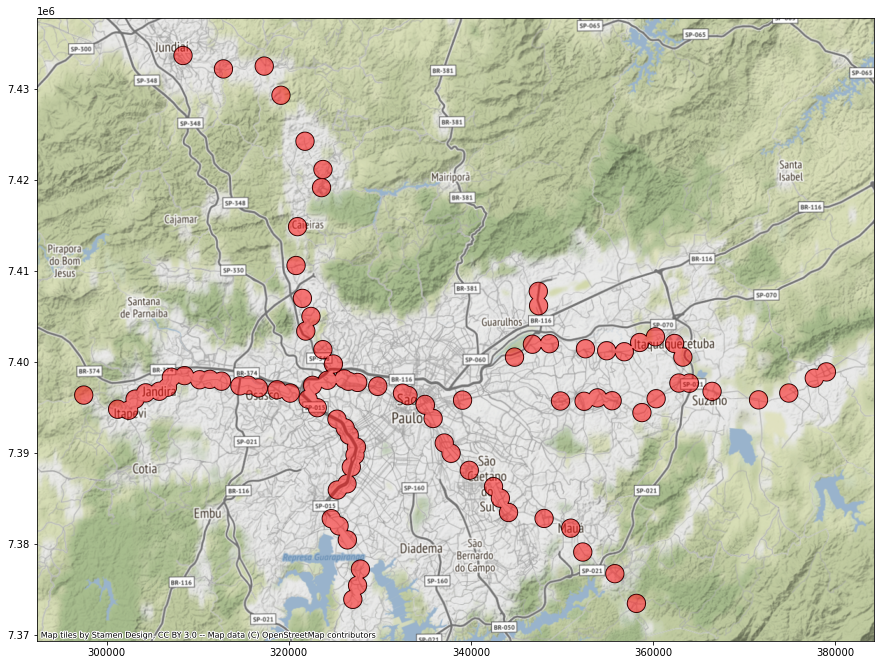

In [41]:
ax = est_trem_dissolve.plot(figsize=(15, 15), color="None")

est_trem_dissolve.plot(ax=ax, edgecolor='none', color='red', alpha=0.5)

cx.add_basemap(ax, crs=A.crs)

# Clip

In [42]:
trem_clip = lin_trem_dissolve.clip(est_trem_dissolve)

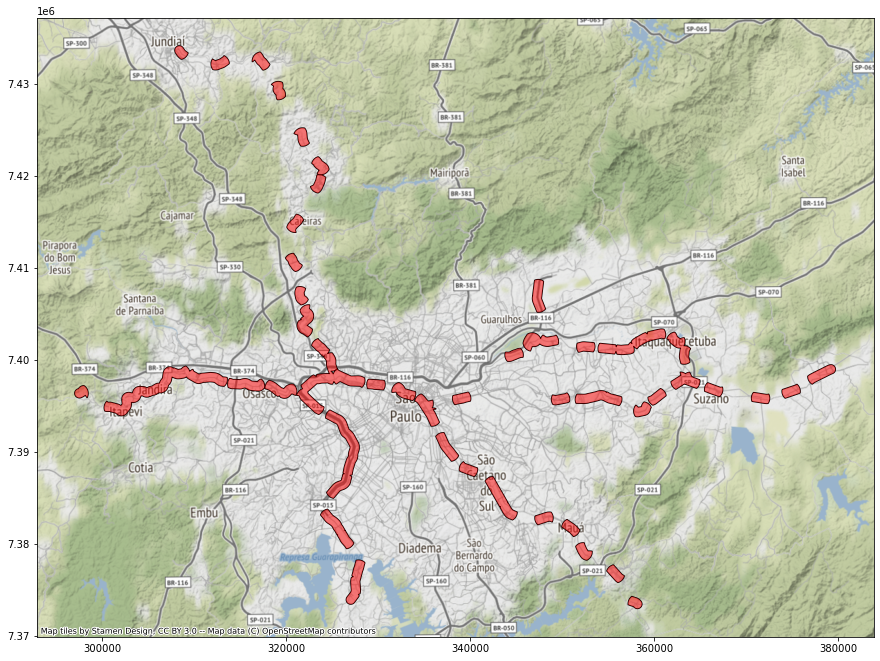

In [43]:
ax = trem_clip.plot(figsize=(15, 15), color="None")

trem_clip.plot(ax=ax, edgecolor='none', color='red', alpha=0.5)

cx.add_basemap(ax, crs=A.crs)

# Union

In [44]:
B.head()

,geometry
0,"POLYGON ((344209.966 7400832.378, 344223.927 7..."
1,"POLYGON ((344527.493 7400981.663, 344533.839 7..."
2,"POLYGON ((344387.389 7400907.608, 344391.247 7..."
3,"POLYGON ((319277.581 7397115.058, 319307.731 7..."
4,"POLYGON ((319229.336 7397155.049, 319238.743 7..."


In [45]:
B.shape

(45, 1)

In [46]:
regiao = []
for i in range(len(B)):
    regiao.append('SP')

print(regiao)

['SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP', 'SP']


In [47]:
len(regiao)

45

In [48]:
regiao_df = pd.DataFrame({'Região': regiao})

In [49]:
regiao_df.head()

,Região
0,SP
1,SP
2,SP
3,SP
4,SP


In [50]:
regiao_df.shape

(45, 1)

In [52]:
# Podemos utilizar left_on  e right_on
lin_reg_merge = B.merge(regiao_df, left_index=True, right_index=True)

In [53]:
lin_reg_merge.head()

,geometry,Região
0,"POLYGON ((344209.966 7400832.378, 344223.927 7...",SP
1,"POLYGON ((344527.493 7400981.663, 344533.839 7...",SP
2,"POLYGON ((344387.389 7400907.608, 344391.247 7...",SP
3,"POLYGON ((319277.581 7397115.058, 319307.731 7...",SP
4,"POLYGON ((319229.336 7397155.049, 319238.743 7...",SP
